**Importing libraries**

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd 
import numpy as np 
from tqdm.auto import tqdm
import matplotlib.pyplot as plt 
import cv2 
from PIL import Image
import os 
import glob as gb

import torch 
import torch.nn as nn 
import torch.nn.functional as F 
from torch.optim import Adam , lr_scheduler 
import torchvision 
from torchvision import datasets 
import torchvision.transforms as transforms
from torchvision.transforms import ToTensor
from torch.utils.data import DataLoader
from torch.utils.data import Dataset

from sklearn.model_selection import train_test_split 

**Loading dataset**

In [ ]:
def walk_through_data(dir_path) : 
    for dirpath , dirnames , filenames in tqdm(os.walk(dir_path)) : 
        print(f"There are {len(dirnames)} directions and {len(filenames)} images in {dirpath}")

In [3]:
dataset_path='/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set'

In [4]:
walk_through_data(dataset_path)

0it [00:00, ?it/s]

There are 2 directions and 0 images in /kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set
There are 2 directions and 0 images in /kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets
There are 0 directions and 5000 images in /kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca
There are 0 directions and 5000 images in /kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_n
There are 3 directions and 0 images in /kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/lung_image_sets
There are 0 directions and 5000 images in /kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/lung_image_sets/lung_aca
There are 0 directions and 5000 images in /kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/lung_image_sets/lung_scc
There 

In [5]:
extension=[]
for cat in tqdm(os.listdir(dataset_path)) : 
    for folder in os.listdir(dataset_path + "/" + cat) : 
        for file in os.listdir(dataset_path + "/" + cat + "/" + folder + "/") : 
            if os.path.isfile(dataset_path + "/" + cat + "/" + folder + "/" + file) : 
                extension.append(os.path.splitext(file)[1])

  0%|          | 0/2 [00:00<?, ?it/s]

In [6]:
print(len(extension),np.unique(extension))

25000 ['.jpeg']


In [7]:
categories=[]
classes=[]
for cat in tqdm(os.listdir(dataset_path)) : 
    if cat not in categories : 
        categories.append(cat.replace('_image_sets',''))
        
    for folder in os.listdir(dataset_path + "/" + cat) : 
        if folder not in classes : 
            classes.append(folder)

  0%|          | 0/2 [00:00<?, ?it/s]

In [8]:
categories

['colon', 'lung']

In [9]:
classes

['colon_aca', 'colon_n', 'lung_aca', 'lung_scc', 'lung_n']

In [10]:
img_label={}
for key in categories : 
    dic={}
    for value in classes : 
        if key in value : 
            dic[value]=classes.index(value)
    img_label[key]=dic

In [11]:
img_label

{'colon': {'colon_aca': 0, 'colon_n': 1},
 'lung': {'lung_aca': 2, 'lung_scc': 3, 'lung_n': 4}}

In [12]:
def getlabel(n) : 
    for i , j in img_label.items() : 
        for x , y in j.items() : 
            if n==y : 
                return i , x

In [13]:
getlabel(1)

('colon', 'colon_n')

In [14]:
dataset_path_list=[]
dataset_labels=[]
for cat in tqdm(os.listdir(dataset_path)) : 
    for folder in os.listdir(dataset_path + "/" + cat) : 
        files=gb.glob(pathname = str(dataset_path + "/" + cat + "/" + folder + "/*.jpeg"))
        for file in files : 
            dataset_path_list.append(file)
            dataset_labels.append(img_label[cat.replace('_image_sets','')][folder])

  0%|          | 0/2 [00:00<?, ?it/s]

In [15]:
len(dataset_path_list) , len(dataset_labels)

(25000, 25000)

In [16]:
np.unique(dataset_labels)

array([0, 1, 2, 3, 4])

In [17]:
img_size=250

In [18]:
dataset_images=[]
for cat in tqdm(os.listdir(dataset_path)) : 
    for folder in os.listdir(dataset_path + "/" + cat) : 
        files=gb.glob(pathname = str(dataset_path + "/" + cat + "/" + folder + "/*.jpeg"))
        for file in files : 
            img=cv2.imread(file)
            img=cv2.resize(img,(img_size,img_size))
            dataset_images.append(list(img))

  0%|          | 0/2 [00:00<?, ?it/s]

In [19]:
print(np.array(dataset_images).shape)

(25000, 250, 250, 3)


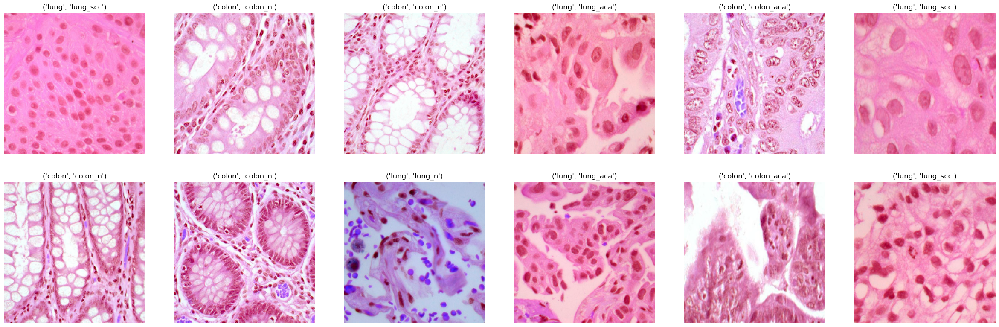

In [20]:
plt.figure(figsize=(30,30))
for n , i in enumerate(list(np.random.randint(0,len(dataset_images),12))):
    plt.subplot(6,6,n+1)
    plt.imshow(dataset_images[i])
    plt.axis('off')
    plt.title(getlabel(dataset_labels[i]))

**Split dataset**

In [21]:
train_path_list , test_path_list , train_labels , test_labels = train_test_split(dataset_path_list , dataset_labels , train_size=0.80 , random_state=0)

In [22]:
print(f"The size of the training set is : {len(train_path_list)}")
print(f"The size of the testing set is : {len(test_path_list)}")

The size of the training set is : 20000
The size of the testing set is : 5000


**Gettting images into tensors**

In [23]:
 basic_transform=transforms.Compose([
     transforms.Resize(size=(img_size,img_size)) , 
     transforms.ToTensor()
 ])

In [24]:
class InvalidDatasetException(Exception):
    
    def __init__(self,len_of_paths,len_of_labels):
        super().__init__(
            f"Number of paths ({len_of_paths}) is not compatible with number of labels ({len_of_labels})"
        )

In [25]:
class train_data(Dataset) : 
    def __init__(self,train_path , train_label , transform_method) : 
        self.train_path=train_path 
        self.train_label=train_label 
        self.transform_method = transform_method 
        if len(self.train_path) != len(self.train_label):
            raise InvalidDatasetException(self.train_path,self.train_label)
            
            
    def __len__(self) : 
        return len(self.train_path)
    
    
    def __getitem__(self,index) : 
        image=Image.open(self.train_path[index])
        tensor_image=self.transform_method(image)
        label=self.train_label[index]
        
        return tensor_image , label 

In [26]:
train_set = train_data(train_path_list , train_labels , basic_transform) 

In [27]:
np.unique(train_set.train_label)

array([0, 1, 2, 3, 4])

In [28]:
train_set.__len__()

20000

In [29]:
filer_train_image=train_set.__getitem__(1000)

In [30]:
filer_train_image[0].shape

torch.Size([3, 250, 250])

In [31]:
getlabel(filer_train_image[1])

('colon', 'colon_n')

In [32]:
class test_data(Dataset) : 
    def __init__(self,test_path , test_label , transform_method) : 
        self.test_path = test_path 
        self.test_label = test_label 
        self.transform_method = transform_method 
        if len(self.test_path) != len(self.test_label):
            raise InvalidDatasetException(self.test_path,self.test_label)
            
             
    def __len__(self) : 
        return len(self.test_path) 
    
    
    def __getitem__(self,index) : 
        image=Image.open(self.test_path[index])
        tensor_image = self.transform_method(image)
        label=self.test_label[index]
        
        return tensor_image , label

In [33]:
test_set = test_data(test_path_list , test_labels , basic_transform)

In [34]:
np.unique(test_set.test_label)

array([0, 1, 2, 3, 4])

In [35]:
test_set.__len__()

5000

In [36]:
filer_test_image = test_set.__getitem__(2000)

In [37]:
filer_test_image[0].shape

torch.Size([3, 250, 250])

In [38]:
getlabel(filer_test_image[1])

('lung', 'lung_scc')

In [39]:
BATCH_SIZE = 128

**Creating dataloaders**

In [40]:
torch.manual_seed(42)
train_dataloader=DataLoader(
    dataset=train_set , 
    batch_size = BATCH_SIZE , 
    shuffle = True 
)

In [41]:
torch.manual_seed(42)
test_dataloader=DataLoader(
    dataset=test_set , 
    batch_size = BATCH_SIZE , 
    shuffle=False 
)

In [42]:
print(f"the size of the train dataloader {len(train_dataloader)} batches of {BATCH_SIZE}")

the size of the train dataloader 157 batches of 128


In [43]:
print(f"the size of the test dataloader {len(test_dataloader)} batches of {BATCH_SIZE}")

the size of the test dataloader 40 batches of 128


In [44]:
trainimage_sample , trainlabel_sample = next(iter(train_dataloader)) 
trainimage_sample.shape , trainlabel_sample.shape

(torch.Size([128, 3, 250, 250]), torch.Size([128]))

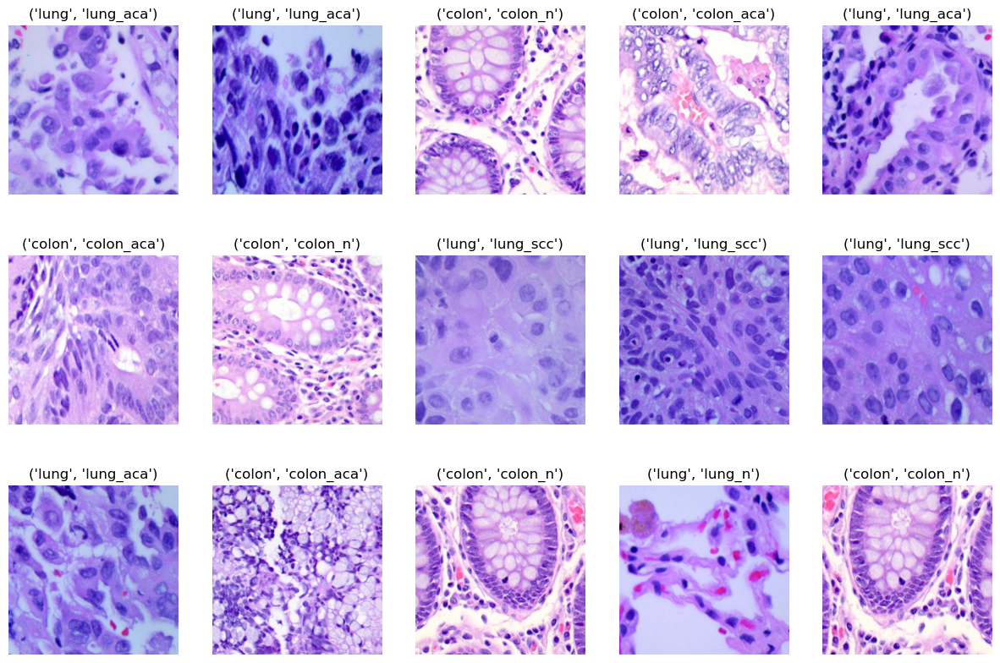

In [45]:
fig, axis = plt.subplots(3, 5, figsize=(15, 10))
for i, ax in enumerate(axis.flat):
    with torch.no_grad():
        img = trainimage_sample[i].numpy()
        img = np.transpose(img, (1, 2, 0))
        ax.imshow(img)
        ax.set(title = f"{getlabel(trainlabel_sample[i])}")
        ax.axis('off')

In [46]:
def param_count(model):
    params = [p.numel() for p in model.parameters() if p.requires_grad]
    print('Total number of parameters : ', sum(params))

**Building the model**

In [47]:
class CNN(nn.Module) : 
    def __init__(self,input_shape , output) : 
        super().__init__()
        self.block1=nn.Sequential(
            nn.Conv2d(
                in_channels=input_shape , 
                out_channels=32 , 
                kernel_size=(3,3) , 
                stride=2 , 
                padding = 1 
            ) , 
            
            nn.ReLU() , 
            
            nn.Conv2d(
                in_channels=32 , 
                out_channels=64 , 
                kernel_size=(3,3) , 
                stride=2 , 
                padding=1 
            ) , 
            
            nn.ReLU() , 
            
            nn.MaxPool2d(kernel_size=2)
        )
        
        self.block2=nn.Sequential(
            nn.Conv2d(
                in_channels=64 , 
                out_channels=128 , 
                kernel_size=(3,3) , 
                stride = 2 , 
                padding = 1 
            ) , 
            
            nn.ReLU() , 
            
            nn.Conv2d(
                in_channels=128 , 
                out_channels=256 , 
                kernel_size = (3,3) , 
                stride = 2 , 
                padding = 1 
            ) ,
            
            nn.ReLU() , 
            
            nn.MaxPool2d(kernel_size=2)
        )
        
        self.fully_connected_layer=nn.Sequential(
            nn.Flatten() , 
            nn.Linear(in_features=256*4*4
                      , out_features=output)
        )
        
        
    def forward(self,x) : 
        x=self.block1(x) 
#         print(f"The output shape of conv block1 is : {x.shape}\n\n")
        x=self.block2(x) 
#         print(f"The output shape of conv block2 is : {x.shape}\n\n")
        x=self.fully_connected_layer(x)
        return x

In [48]:
torch.manual_seed(42)
model=CNN(
    input_shape = 3 , 
    output=len(classes)
)

In [49]:
model.parameters

<bound method Module.parameters of CNN(
  (block1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (block2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (fully_connected_layer): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=4096, out_features=5, bias=True)
  )
)>

In [50]:
param_count(model)

Total number of parameters :  408901


**Setting the cost function and the optimizer**

In [51]:
criterion=nn.CrossEntropyLoss()
optimizer=Adam(model.parameters(),lr=0.001)

**Training the model**

In [52]:
epochs=10 
training_acc=[]
training_loss=[]
for i in tqdm(range(epochs)) : 
    epoch_loss=0
    correct=0
    total=0
    for batch , (x_train , y_train) in enumerate(train_dataloader) : 
        y_pred=model.forward(x_train)
        loss=criterion(y_pred,y_train)
        
        if batch % 50 == 0:
            print(f"Looked at {batch * len(x_train)}/{len(train_dataloader.dataset)} samples.")
            
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        
        epoch_loss+=loss
        
        _,pred = torch.max(y_pred,dim=1)
        correct = correct + torch.sum(pred == y_train).item()
        total += y_train.size(0)
        
    training_loss.append((epoch_loss/len(train_dataloader)).detach().numpy())
    training_acc.append(100 * correct / total)
    print(f"Epoch {i}: Accuracy: {100 * correct/total}, Loss: {(epoch_loss/len(train_dataloader))}")

  0%|          | 0/10 [00:00<?, ?it/s]

Looked at 0/20000 samples.
Looked at 6400/20000 samples.
Looked at 12800/20000 samples.
Looked at 19200/20000 samples.
Epoch 0: Accuracy: 71.905, Loss: 0.6219473481178284
Looked at 0/20000 samples.
Looked at 6400/20000 samples.
Looked at 12800/20000 samples.
Looked at 19200/20000 samples.
Epoch 1: Accuracy: 85.175, Loss: 0.3522958755493164
Looked at 0/20000 samples.
Looked at 6400/20000 samples.
Looked at 12800/20000 samples.
Looked at 19200/20000 samples.
Epoch 2: Accuracy: 89.195, Loss: 0.27057239413261414
Looked at 0/20000 samples.
Looked at 6400/20000 samples.
Looked at 12800/20000 samples.
Looked at 19200/20000 samples.
Epoch 3: Accuracy: 91.425, Loss: 0.20995306968688965
Looked at 0/20000 samples.
Looked at 6400/20000 samples.
Looked at 12800/20000 samples.
Looked at 19200/20000 samples.
Epoch 4: Accuracy: 93.385, Loss: 0.16986671090126038
Looked at 0/20000 samples.
Looked at 6400/20000 samples.
Looked at 12800/20000 samples.
Looked at 19200/20000 samples.
Epoch 5: Accuracy: 94.9

In [53]:
print(f"The loss of the training set is : {training_loss[-1]}")
print(f"The accuracy of the training set is : {training_acc[-1]}%")

The loss of the training set is : 0.06329074501991272
The accuracy of the training set is : 97.49%


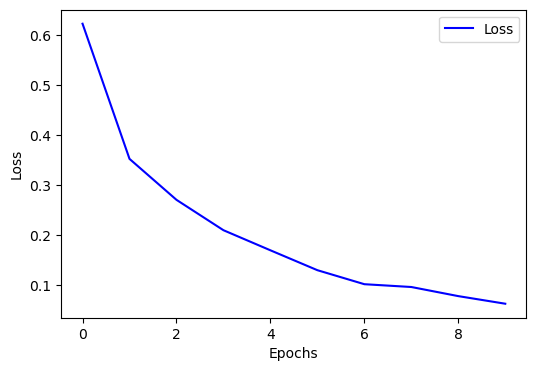

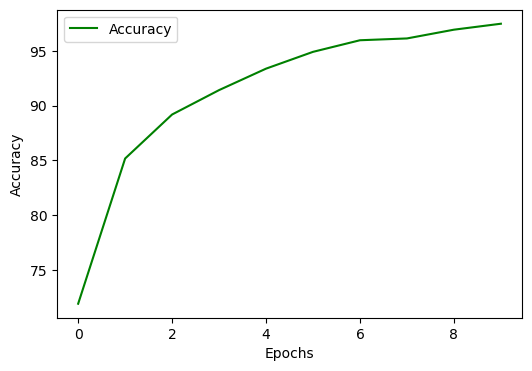

In [54]:
plt.subplots(figsize=(6,4))
plt.plot(range(epochs),training_loss,color="blue",label="Loss")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.subplots(figsize=(6,4))
plt.plot(range(epochs),training_acc,color="green",label="Accuracy")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

**Model Evaluation**

In [55]:
test_loss=0
test_acc= 0
torch.manual_seed(42)
with torch.no_grad() : 
        for x_test , y_test in test_dataloader : 
            y_pred=model.forward(x_test)
            loss=criterion(y_pred,y_test)
            test_loss+=loss
            test_acc += accuracy_score(y_test , y_pred.argmax(dim=1))
test_loss/=len(test_dataloader)
test_acc/=len(test_dataloader)

In [83]:
print(f"The loss of the testing set is : {test_loss}\n")
print(f"The accuracy of the testing set is : {test_acc*100}%\n")

The loss of the testing set is : 0.06880012899637222

The accuracy of the testing set is : 97.578125%



**Show predictions**

In [79]:
y_preds=[]
x_test_samples=[]
y_test_samples=[]
torch.manual_seed(42)
with torch.no_grad() : 
    for x_test , y_test in test_dataloader : 
        x_test_samples.append(x_test)
        y_test_samples.append(y_test.detach().numpy())
        y_pred=model.forward(x_test)
        y_preds.append(y_pred.detach().numpy())

In [81]:
y_preds=np.array(y_preds)
x_test_samples=np.array(x_test_samples)
y_test_samples=np.array(y_test_samples)

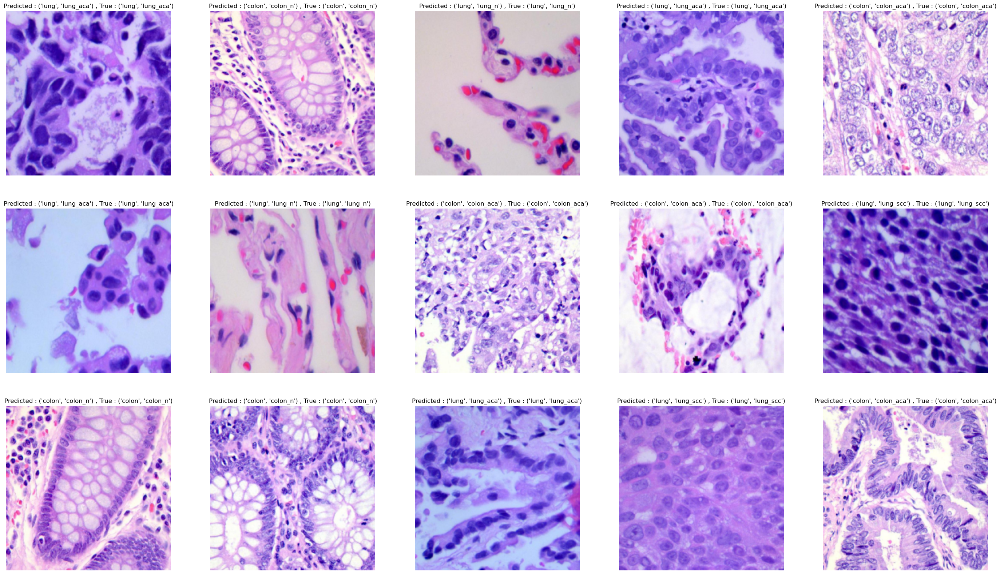

In [82]:
fig, axis = plt.subplots(3, 5, figsize=(35, 20))
for i, ax in enumerate(axis.flat):
    with torch.no_grad():
        img = x_test_samples[0][i].numpy()
        img = np.transpose(img, (1, 2, 0))
        ax.imshow(img)
        ax.set(title = f"Predicted : {getlabel(y_preds[0][i].argmax())} , True : {getlabel(y_test_samples[0][i])}")
        ax.axis('off')